In [ ]:
# with 15 samples of orig. data getting 500 samples of syn data

# https://www.kaggle.com/code/ankitapandav1212/dry-bean-dataset-using-knn-algorithm
# https://www.kaggle.com/code/ankitapandav1212/dry-bean-dataset-using-knn-algorithm?scriptVersionId=112288982&cellId=6
# to learn:
# data.info(), data.describe()
# https://www.kaggle.com/code/ankitapandav1212/dry-bean-dataset-using-knn-algorithm?scriptVersionId=112288982&cellId=20
# to learn:
# Imbalncing Technique, StratifiedKFold (?)

# https://www.kaggle.com/code/ziadhamadafathy/classify-dry-bean-with-accuracy-90-by-some-models
# to learn:
# sns.countplot(df['Class']), df['Class'].value_counts()
# SelectKBest for feature reduction


In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.cluster import KMeans 
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler

In [7]:
iris = pd.read_csv("bean-clean.csv")
# Downsample each class to 522
def downsample(df, n):
    return df.groupby('Class').apply(lambda x: x.sample(n=n, random_state=42)).reset_index(drop=True)

# Apply the downsampling
downsampled_data = downsample(iris, 522)
iris = downsampled_data
x = iris.iloc[:, [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]].values
iris.info()
iris[0:10]

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2610 entries, 0 to 2609
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             2610 non-null   int64  
 1   Perimeter        2610 non-null   float64
 2   MajorAxisLength  2610 non-null   float64
 3   MinorAxisLength  2610 non-null   float64
 4   AspectRation     2610 non-null   float64
 5   Eccentricity     2610 non-null   float64
 6   ConvexArea       2610 non-null   int64  
 7   EquivDiameter    2610 non-null   float64
 8   Extent           2610 non-null   float64
 9   Solidity         2610 non-null   float64
 10  roundness        2610 non-null   float64
 11  Compactness      2610 non-null   float64
 12  ShapeFactor1     2610 non-null   float64
 13  ShapeFactor2     2610 non-null   float64
 14  ShapeFactor3     2610 non-null   float64
 15  ShapeFactor4     2610 non-null   float64
 16  Class            2610 non-null   object 
dtypes: float64(14)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,70776,1060.894,386.619944,234.100208,1.651515,0.795842,71978,300.191276,0.775763,0.983300,0.790227,0.776451,0.005463,0.001225,0.602875,0.995658,BARBUNYA
1,66370,1004.139,339.287072,249.883085,1.357783,0.676443,67637,290.697280,0.720536,0.981268,0.827169,0.856789,0.005112,0.001699,0.734087,0.996731,BARBUNYA
2,60736,985.501,342.445302,226.741776,1.510288,0.749393,61680,278.085377,0.789353,0.984695,0.785854,0.812058,0.005638,0.001512,0.659438,0.995941,BARBUNYA
3,65219,1011.110,353.650546,235.308999,1.502920,0.746512,66672,288.165595,0.719436,0.978207,0.801654,0.814831,0.005423,0.001475,0.663950,0.997864,BARBUNYA
4,51332,889.637,330.822804,198.618899,1.665616,0.799716,52283,255.651975,0.751688,0.981811,0.815028,0.772776,0.006445,0.001418,0.597183,0.994678,BARBUNYA
5,61988,969.081,359.167282,220.617660,1.628008,0.789113,62965,280.936955,0.701865,0.984483,0.829464,0.782190,0.005794,0.001338,0.611821,0.996049,BARBUNYA
6,73347,1082.968,363.797646,257.664828,1.411903,0.705948,74564,305.594995,0.814831,0.983678,0.785889,0.840014,0.004960,0.001523,0.705623,0.996271,BARBUNYA
7,76385,1057.340,384.838455,254.360943,1.512962,0.750425,77525,311.859588,0.823558,0.985295,0.858596,0.810365,0.005038,0.001340,0.656691,0.993549,BARBUNYA
8,68056,1054.621,359.731355,242.202544,1.485250,0.739381,69299,294.366422,0.716801,0.982063,0.768924,0.818295,0.005286,0.001462,0.669607,0.994534,BARBUNYA
9,67792,1064.282,403.333845,214.955791,1.876357,0.846148,68830,293.794920,0.803099,0.984919,0.752099,0.728416,0.005950,0.001033,0.530590,0.995577,BARBUNYA


In [8]:
#Frequency distribution of species"
iris_outcome = pd.crosstab(index=iris["Class"],  # Make a crosstab
                              columns="count")      # Name the count column

iris_outcome

col_0,count
Class,
BARBUNYA,522
BOMBAY,522
CALI,522
HOROZ,522
SEKER,522


In [9]:
iris_1=iris.loc[iris["Class"]=="SEKER"]
iris_2=iris.loc[iris["Class"]=="BARBUNYA"]
iris_3=iris.loc[iris["Class"]=="BOMBAY"]
iris_4=iris.loc[iris["Class"]=="CALI"]
iris_5=iris.loc[iris["Class"]=="HOROZ"]

/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:848: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  func(*plot_args, **plot_kwargs)
/Users

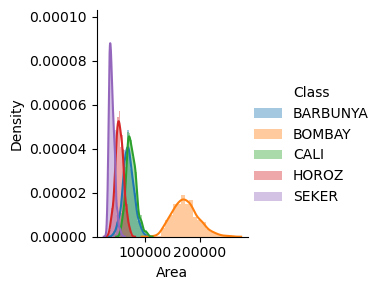

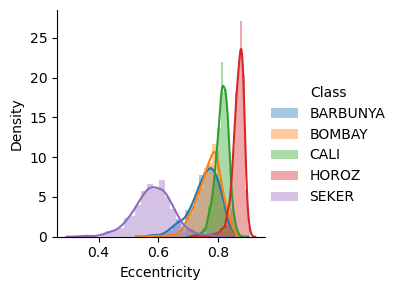

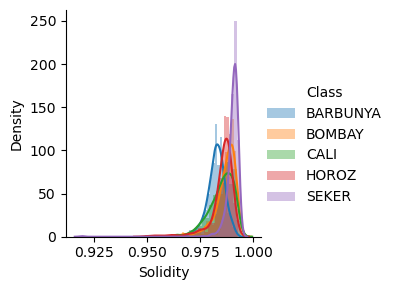

In [10]:
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Area").add_legend()
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Eccentricity").add_legend()
sns.FacetGrid(iris,hue="Class",height=3).map(sns.distplot,"Solidity").add_legend()
plt.show()

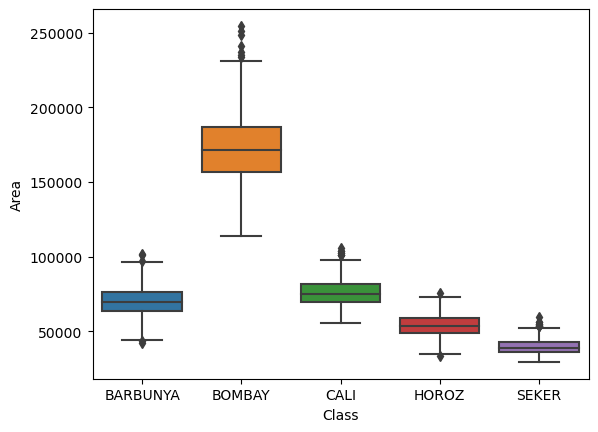

In [11]:
sns.boxplot(x="Class",y="Area",data=iris)
plt.show()

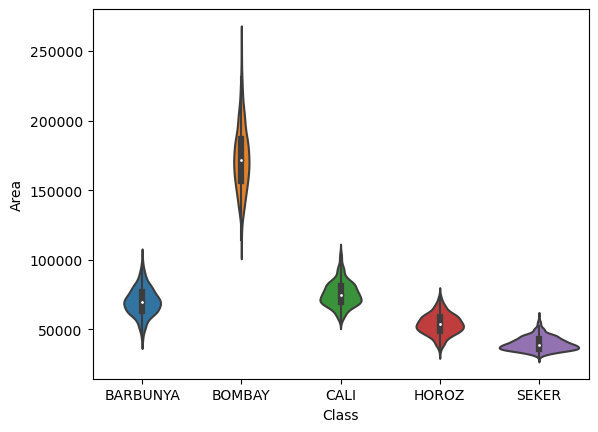

In [12]:
sns.violinplot(x="Class",y="Area",data=iris)
plt.show()

/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)
/Users/maqowais/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


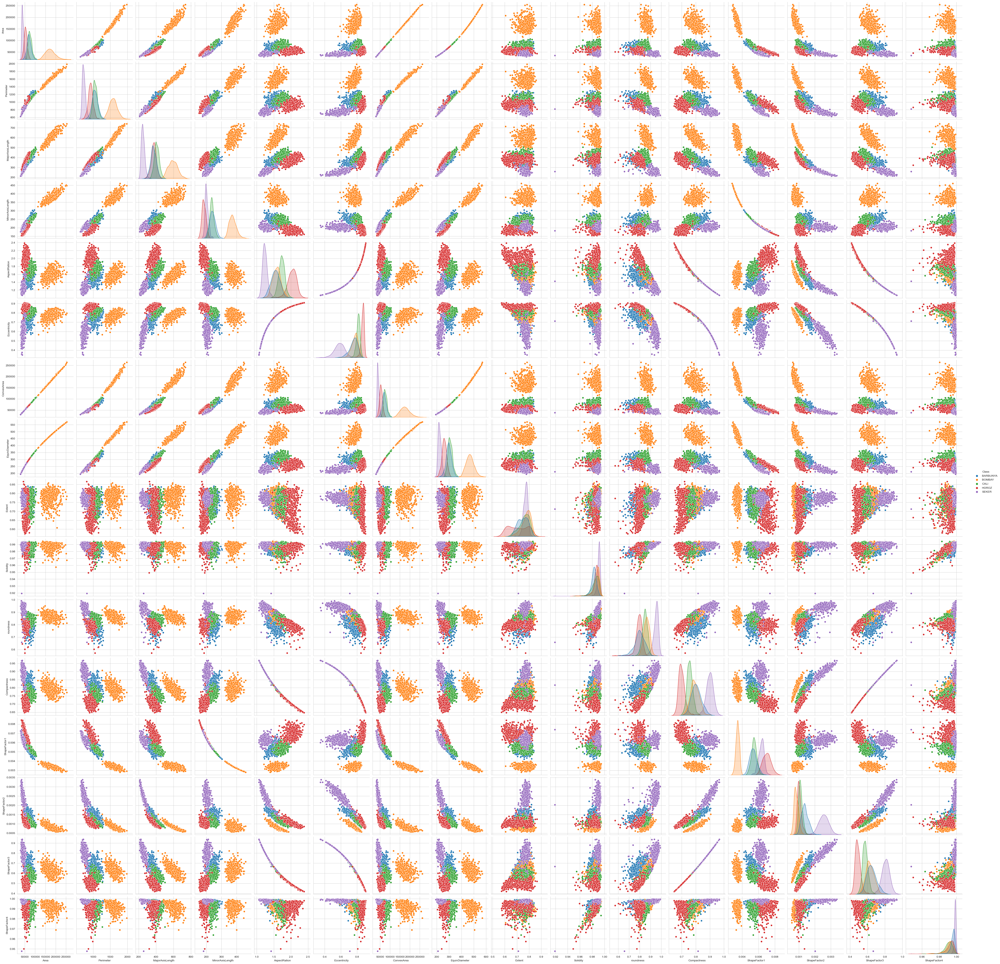

In [13]:
sns.set_style("whitegrid")
sns.pairplot(iris,hue="Class",size=3);
plt.show()

In [9]:
#Finding the optimum number of clusters for k-means classification
from sklearn.cluster import KMeans
wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
    kmeans.fit(x)
    wcss.append(kmeans.inertia_)


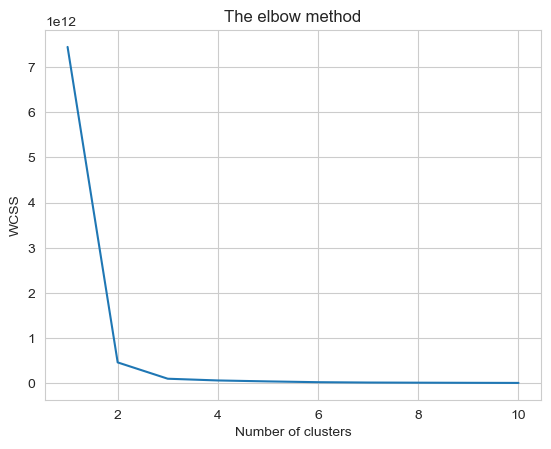

In [10]:
plt.plot(range(1, 11), wcss)
plt.title('The elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS') #within cluster sum of squares
plt.show()


In [11]:
kmeans = KMeans(n_clusters = 5, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_kmeans = kmeans.fit_predict(x)

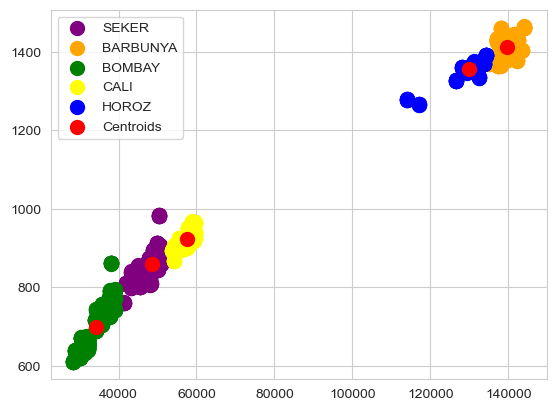

In [12]:
# iris_1=iris.loc[iris["Class"]=="SEKER"]
# iris_2=iris.loc[iris["Class"]=="BARBUNYA"]
# iris_3=iris.loc[iris["Class"]=="BOMBAY"]
# iris_4=iris.loc[iris["Class"]=="CALI"]
# iris_5=iris.loc[iris["Class"]=="HOROZ"]
#Visualising the clusters
plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'SEKER')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'BARBUNYA')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'BOMBAY')
plt.scatter(x[y_kmeans == 3, 0], x[y_kmeans == 3, 1], s = 100, c = 'yellow', label = 'CALI')
plt.scatter(x[y_kmeans == 4, 0], x[y_kmeans == 4, 1], s = 100, c = 'blue', label = 'HOROZ')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')

plt.legend()

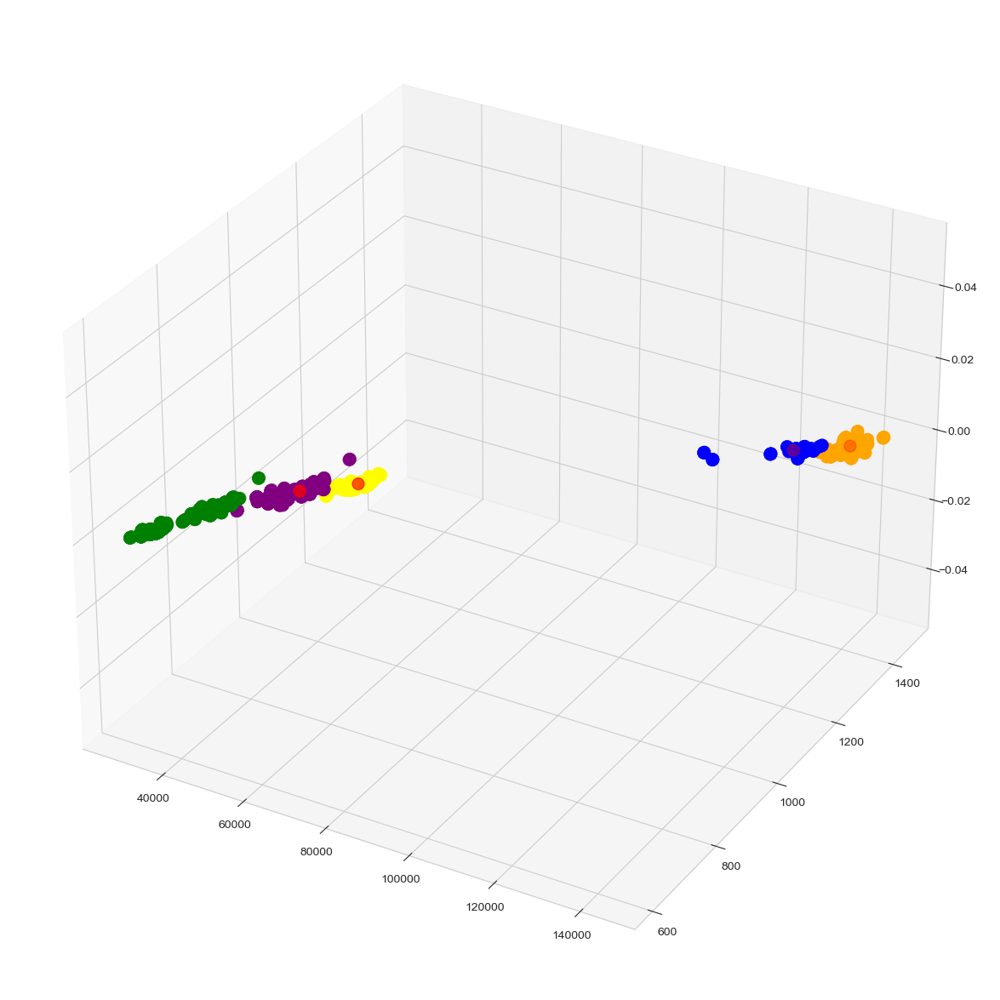

In [13]:
# 3d scatterplot using matplotlib

fig = plt.figure(figsize = (15,15))
ax = fig.add_subplot(111, projection='3d')
# plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'Iris-setosa')
# plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'Iris-versicolour')
# plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'Iris-virginica')

plt.scatter(x[y_kmeans == 0, 0], x[y_kmeans == 0, 1], s = 100, c = 'purple', label = 'SEKER')
plt.scatter(x[y_kmeans == 1, 0], x[y_kmeans == 1, 1], s = 100, c = 'orange', label = 'BARBUNYA')
plt.scatter(x[y_kmeans == 2, 0], x[y_kmeans == 2, 1], s = 100, c = 'green', label = 'BOMBAY')
plt.scatter(x[y_kmeans == 3, 0], x[y_kmeans == 3, 1], s = 100, c = 'yellow', label = 'CALI')
plt.scatter(x[y_kmeans == 4, 0], x[y_kmeans == 4, 1], s = 100, c = 'blue', label = 'HOROZ')

#Plotting the centroids of the clusters
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:,1], s = 100, c = 'red', label = 'Centroids')
plt.show()

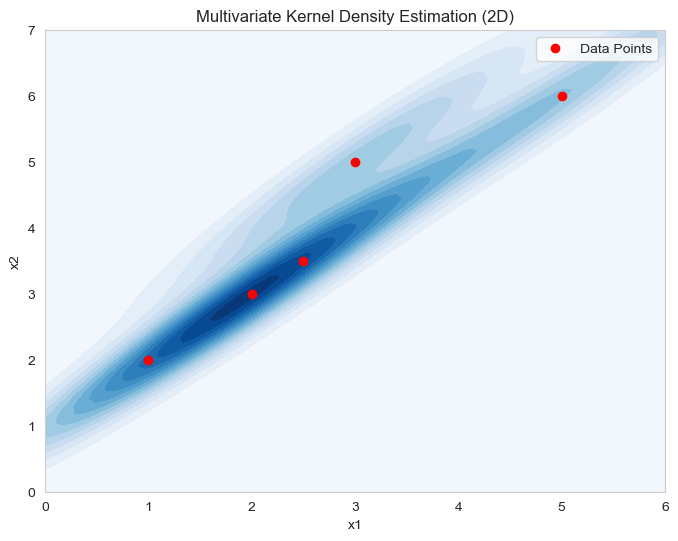

In [14]:
# other experimentation
from scipy.stats import gaussian_kde

# Multivariate Data (2D)
X_multivariate = np.array([[1, 2], [2, 3], [2.5, 3.5], [3, 5], [5, 6]]).T

# Perform KDE with Gaussian kernel
kde_multivariate = gaussian_kde(X_multivariate)

# Create a grid over the 2D space
x, y = np.mgrid[0:6:100j, 0:7:100j]
positions = np.vstack([x.ravel(), y.ravel()])
density = kde_multivariate(positions).reshape(x.shape)

# Plot the multivariate KDE as a contour plot
plt.figure(figsize=(8, 6))
plt.contourf(x, y, density, cmap='Blues', levels=20)
plt.scatter(X_multivariate[0], X_multivariate[1], c='red', label='Data Points')

# Labels and legend
plt.title('Multivariate Kernel Density Estimation (2D)')
plt.xlabel('x1')
plt.ylabel('x2')
plt.legend()

# Show plot
plt.show()


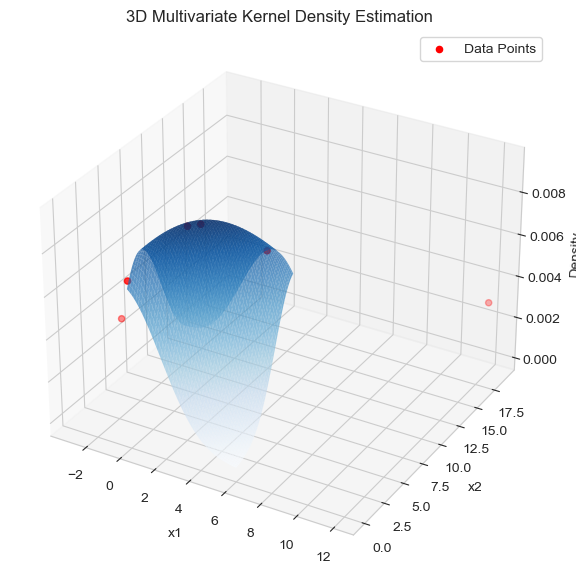

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from mpl_toolkits.mplot3d import Axes3D

# Multivariate Data (2D)
X_multivariate = np.array([[-1, 2], [2, 3], [2.5, 3.5], [-3, 5], [5, 6], [12, 19]]).T

# Perform KDE with Gaussian kernel
kde_multivariate = gaussian_kde(X_multivariate)

# Create a grid over the 2D space
x, y = np.mgrid[0:6:100j, 0:7:100j]
positions = np.vstack([x.ravel(), y.ravel()])
density = kde_multivariate(positions).reshape(x.shape)

# Plot the multivariate KDE as a 3D surface plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot surface
ax.plot_surface(x, y, density, cmap='Blues', edgecolor='none', alpha=0.7)

# Scatter original data points
ax.scatter(X_multivariate[0], X_multivariate[1], kde_multivariate(X_multivariate), c='red', label='Data Points', zorder=5)

# Labels
ax.set_title('3D Multivariate Kernel Density Estimation')
ax.set_xlabel('x1')
ax.set_ylabel('x2')
ax.set_zlabel('Density')

plt.legend()
plt.show()
